/home/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from ipykernel import kernelapp as app
/home/user/anaconda3/lib/python3.7/site-packages/dask/dataframe/utils.py:14: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.

2021-03-07 22:16:29.536 INFO    numexpr.utils: NumExpr defaulting to 4 threads.
/home/user/anaconda3/lib/python3.7/site-packages/geopandas/_compat.py:88: UserWarning:

The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.



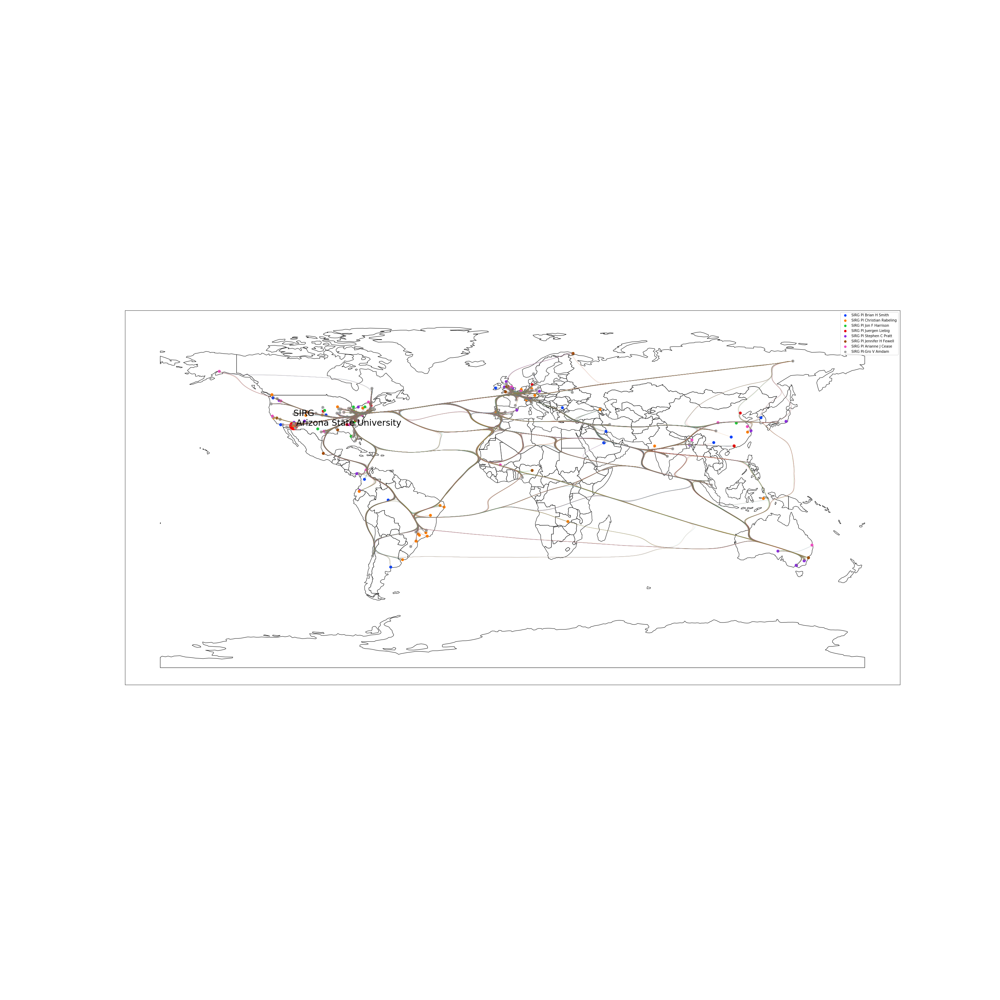

In [1]:

%matplotlib inline


from PIL import Image
#from matplotlib.pyplot import imshow
from IPython.display import display # to display images

import shelve
import streamlit as st
import os
import pandas as pd
import pickle
import streamlit as st
from holoviews import opts, dim
from collections import Iterable
import networkx
#import bokeh_chart

from auxillary_methods import author_to_coauthor_network, network  # ,try_again
import holoviews as hv
from auxillary_methods import (
    push_frame_to_screen,
    plotly_sized,
)  # , data_shade, draw_wstate_tree
import chord2
import shelve

import geopandas
import plotly.graph_objects as go
import pandas as pd
import geopandas
import streamlit as st
import numpy as np
import pickle
import seaborn as sns
from collections import OrderedDict
from netgeovis2 import graph_for_app, edge_bundle, edge_bundle_plotly, recalculate_sirg_sub_nets
def streamlit_maps():
    data = pd.DataFrame(
        {
            "awesome cities": ["Chicago", "Minneapolis", "Louisville", "Topeka"],
            "latitude": [41.868171, 44.979840, 38.257972, 39.030575],
            "longitude": [-87.667458, -93.272474, -85.765187, -95.702548],
        }
    )
    st.map(data)


def user_manual_fix_missing(list_of_dicts):
    st.sidebar.title("Add new or replace author location in dataframe")
    name = st.sidebar.text_input("Enter Author Name")
    address = st.sidebar.text_input("Insitution Address")
    longitude = st.sidebar.text_input("longitude")
    latitude = st.sidebar.text_input("latitude")
    if st.button("Add row"):
        list_of_dicts.append(
            {
                "name": name,
                "address": address,
                "longitude": longitude,
                "latitude": latitude,
            }
        )
    st.write(pd.DataFrame(get_data()))
    st.sidebar.markdown(get_table_download_link_csv(df), unsafe_allow_html=True)


image = Image.open("bundled_graph_static.png", 'r')
display(image)


In [2]:

#def disable_logo(plot, element):
#    plot.state.toolbar.logo = None


hv.extension("bokeh", logo=False)
hv.output(size=300)
#hv.plotting.bokeh.ElementPlot.finalize_hooks.append(disable_logo)
# "Antonin Delpeuch",


from netgeovis2 import (
    main_plot_routine,
    identify_find_missing,
    remove_missing_persons_from_big_net,
)

with open("both_sets_locations.p", "rb") as f:
    both_sets_locations = pickle.load(f)

sirg_author_list = [
    "Brian H. Smith",
    "Christian Rabeling",
    "Jon F. Harrison",
    "Juergen Liebig",
    "Stephen C. Pratt",
    "Jennifer H. Fewell",
    "Arianne J. Cease",
    "Gro V. Amdam",
]
with open("mega_net.p", "rb") as f:
    mg = pickle.load(f)



In [3]:
if os.path.exists("missing_person.p"):
    with open("missing_person.p", "rb") as f:
        temp = pickle.load(f)
    [
        mg,
        both_sets_locations,
        missing_person_name,
        missing_person_location,
        both_sets_locations_missing,
        sirg_author_list,
    ] = temp

In [4]:
missing_person_name

[]

In [5]:
both_sets_locations_missing

{}

In [6]:
missing_person_location

[]

In [7]:
both_sets_locations

{'Chelsea N. Cook': ('Arizona State University',
  (33.42152185, -111.93316158417922)),
 'Brian H. Smith': ('Arizona State University',
  (33.42152185, -111.93316158417922)),
 'Hong Lei': ('Arizona State University', (33.42152185, -111.93316158417922)),
 'Meredith Johnson': ('University of South Florida',
  (28.0599999, -82.41383619025117)),
 'Teddy Cogley': ('Arizona State University',
  (33.42152185, -111.93316158417922)),
 'David Arturo Ruiz Pardo': ('Corporación Universitaria Lasallista Caldas Antioquia CO',
  (6.1002267, -75.6385669)),
 'Christopher M. Jernigan': ('Cornell University',
  (42.4507221, -76.48620432707092)),
 'Richard C. Gerkin': ('Arizona State University',
  (33.42152185, -111.93316158417922)),
 'Javaid Iqbal': ('University of Limerick', (52.67375155, -8.570985622785479)),
 'Kristen R. Hladun': ('Verkhovna Rada Ukraini Kyiv Kyiv UA',
  (50.44743025, 30.536824509195874)),
 'Hael S. Raweh': ('King Saud University Riyadh Riyadh Province SA',
  (24.7246741, 46.62334000

In [8]:
#if os.path.exists("missing_person.p"):
with open("missing_person.p", "rb") as f:
    temp = pickle.load(f)
[
    mg,
    both_sets_locations,
    missing_person_name,
    missing_person_location,
    both_sets_locations_missing,
    sirg_author_list,
] = temp

In [9]:

node_positions = list(both_sets_locations.values())
long_lat = [np[1] for np in node_positions if np[1] is not None]
lat = [coord[0] for coord in long_lat]
long = [coord[1] for coord in long_lat]
node_location_name = [np[0] for np in node_positions if np[1] is not None]

node_person = list([k for k, v in both_sets_locations.items() if v[0] is not None])
# if False:
node_person

['Chelsea N. Cook',
 'Brian H. Smith',
 'Hong Lei',
 'Meredith Johnson',
 'Teddy Cogley',
 'David Arturo Ruiz Pardo',
 'Christopher M. Jernigan',
 'Richard C. Gerkin',
 'Javaid Iqbal',
 'Kristen R. Hladun',
 'Hael S. Raweh',
 'Jiali Liu',
 'Hael S. A. Raweh',
 'Michael S. Engel',
 'Sharon M. Crook',
 'Tobias van Elst',
 'Christian Rabeling',
 'Corrie S. Moreau',
 'Ted R. Schultz',
 'Mônica T. Pupo',
 'Jon Clardy',
 'Cameron R. Currie',
 'Ana Ješovnik',
 'John S. LaPolla',
 'Fransina Latumahina',
 'Jacob J. Herman',
 'Alexander S. Mikheyev',
 'Andre Rodrigues',
 'John E. Lattke',
 'Rebecca M. Clark',
 'Inara R. Leal',
 'Brian L. Fisher',
 'Cai Li',
 'Zhensheng Chen',
 'Zhikai Yang',
 'Rebecca B. Dikow',
 'David R. Nash',
 "Lauren A. O'Connell",
 'Fernando Fernandez',
 'Lizette N. Ramirez',
 'L. Lacey Knowles',
 'Cintia Maria Santos Bezerra',
 'Cara N. Love',
 'Juergen Liebig',
 'Nancy A. Moran',
 'Clint A. Penick',
 'Thomas Roeder',
 'Gregory Donahue',
 'Roberto Bonasio',
 'Jun Wang',
 

In [10]:
#with open("big_g_locations.p", "rb") as f:
#    g_locations = pickle.load(f)
#both_sets_locations.update(g_locations)
#missing_person_name = list(
#    set(missing_person_name) - set(g_locations.keys())
#)



In [11]:
if os.path.exists("missing_person.p"):
    with open("missing_person.p", "rb") as f:
        temp = pickle.load(f)
    [
        mg,
        both_sets_locations,
        missing_person_name,
        missing_person_location,
        both_sets_locations_missing,
        sirg_author_list,
    ] = temp

else:
    (
        mg,
        both_sets_locations,
        missing_person_name,
        missing_person_location,
        both_sets_locations_missing,
        sirg_author_list,
    ) = identify_find_missing()
    # except:
    # both_sets_locations,missing_person_name,missing_person_location,both_sets_locations_missing = identify_find_missing()
    temp = [
        mg,
        both_sets_locations,
        missing_person_name,
        missing_person_location,
        both_sets_locations_missing,
        sirg_author_list,
    ]
    with open("missing_person.p", "wb") as f:
        pickle.dump(temp, f)

# both_sets_locations
# both_sets_locations.keys()

node_positions = list(both_sets_locations.values())
long_lat = [np[1] for np in node_positions if np[1] is not None]
lat = [coord[0] for coord in long_lat]
long = [coord[1] for coord in long_lat]
node_location_name = [np[0] for np in node_positions if np[1] is not None]

node_person = list([k for k, v in both_sets_locations.items() if v[0] is not None])
# if False:
node_person




['Chelsea N. Cook',
 'Brian H. Smith',
 'Hong Lei',
 'Meredith Johnson',
 'Teddy Cogley',
 'David Arturo Ruiz Pardo',
 'Christopher M. Jernigan',
 'Richard C. Gerkin',
 'Javaid Iqbal',
 'Kristen R. Hladun',
 'Hael S. Raweh',
 'Jiali Liu',
 'Hael S. A. Raweh',
 'Michael S. Engel',
 'Sharon M. Crook',
 'Tobias van Elst',
 'Christian Rabeling',
 'Corrie S. Moreau',
 'Ted R. Schultz',
 'Mônica T. Pupo',
 'Jon Clardy',
 'Cameron R. Currie',
 'Ana Ješovnik',
 'John S. LaPolla',
 'Fransina Latumahina',
 'Jacob J. Herman',
 'Alexander S. Mikheyev',
 'Andre Rodrigues',
 'John E. Lattke',
 'Rebecca M. Clark',
 'Inara R. Leal',
 'Brian L. Fisher',
 'Cai Li',
 'Zhensheng Chen',
 'Zhikai Yang',
 'Rebecca B. Dikow',
 'David R. Nash',
 "Lauren A. O'Connell",
 'Fernando Fernandez',
 'Lizette N. Ramirez',
 'L. Lacey Knowles',
 'Cintia Maria Santos Bezerra',
 'Cara N. Love',
 'Juergen Liebig',
 'Nancy A. Moran',
 'Clint A. Penick',
 'Thomas Roeder',
 'Gregory Donahue',
 'Roberto Bonasio',
 'Jun Wang',
 

In [12]:
'''
if os.path.exists("net_cache.p"):
    with open("net_cache.p", "rb") as f:
        temp = pickle.load(f)
    (
        G,
        second,
        lat,
        long,
        node_location_name,
        sirg_author_list,
        subnets,
        megnet,
    ) = temp
'''
subnets, megnet = recalculate_sirg_sub_nets(sirg_author_list)

#if not 'subnets' in locals():
#    subnets, megnet = recalculate_sirg_sub_nets()
(
    G,
    second,
    lat,
    long,
    node_location_name,
    sirg_author_list,
) = remove_missing_persons_from_big_net(
    both_sets_locations, missing_person_name
)

    
    
   # with open("net_cache.p", "wb") as f:
   #     pickle.dump(temp, f)
#second


2021-03-07 22:16:36.416 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:39.298 WARNING root: 
  command:

    streamlit run /home/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py [ARGUMENTS]
2021-03-07 22:16:39.304 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:41.202 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:42.778 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:43.891 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:51.312 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:16:53.345 INFO    requests.packages.urllib3.connectionpool: Starting new HTTPS connection (1): dissem.in
2021-03-07 22:1

In [13]:
for name in sirg_author_list:
    if name in second.nodes:
        store_name = name    
for name in sirg_author_list:
    second.add_node(name, pos=(second.nodes[store_name]['pos'][0], second.nodes[store_name]['pos'][1]))


In [14]:
for name in sirg_author_list:
    if name in second.nodes:
        print(name)


        

Brian H Smith
Christian Rabeling
Jon F Harrison
Juergen Liebig
Stephen C Pratt
Jennifer H Fewell
Arianne J Cease
Gro V Amdam


In [15]:
for name in sirg_author_list:
    if not name in subnets.keys():
        print(name)

In [16]:



tab10 = sns.color_palette("bright")
#subnets = OrderedDict({k: v["g"] for k, v in subnets.items() if hasattr(v, "keys")})
color_map = {}
color_value_index = 0
for k, v in subnets.items():
    color_value_index += 1
    color_map[k] = color_value_index
        
for name in sirg_author_list:
    print(color_map[name],name)

1 Brian H Smith
2 Christian Rabeling
3 Jon F Harrison
4 Juergen Liebig
5 Stephen C Pratt
6 Jennifer H Fewell
7 Arianne J Cease
8 Gro V Amdam


In [17]:

sub_net_numb = {}
for i, (k, v) in enumerate(subnets.items()):
    for sbn in v.nodes:
        sub_net_numb[sbn] = i
sub_net_numb        




{'Meghan M. Bennett': 5,
 'Chelsea N. Cook': 0,
 'Brian H. Smith': 7,
 'Hong Lei': 0,
 'Adrian Fisher': 5,
 'Gloria DeGrandi-Hoffman': 5,
 'Meredith Johnson': 5,
 'Osman Kaftanoglu': 7,
 'Teddy Cogley': 5,
 'Jennifer H. Fewell': 5,
 'Jon F. Harrison': 7,
 'Natalie J. Lemanski': 0,
 'Thiago Mosqueiro': 0,
 'Cahit Ozturk': 5,
 'Jürgen Gadau': 1,
 'Noa Pinter-Wollman': 0,
 'Irina Sinakevitch': 0,
 'Zev Kurtzman': 0,
 'Hyun G. Choi': 0,
 'David Arturo Ruiz Pardo': 0,
 'Romain A. Dahan': 1,
 'Nathaniel Klein': 0,
 'Branimir Bugarija': 0,
 'Erik Wendlandt': 0,
 'Christopher M. Jernigan': 0,
 'Rachael Halby': 0,
 'Richard C. Gerkin': 0,
 'Fernando Locatelli': 0,
 'Abdulaziz S. Alqarni': 0,
 'Hussain Ali': 0,
 'Javaid Iqbal': 0,
 'Ayman A. Owayss': 0,
 'Christina M. Burden': 7,
 'Mira O. Morgan': 7,
 'Kristen R. Hladun': 7,
 'Gro V. Amdam': 7,
 'John J. Trumble': 7,
 'Hael S. Raweh': 0,
 'Ho Ka Chan': 0,
 'Fabian Hersperger': 0,
 'Emiliano Marachlian': 0,
 'Paul Szyszka': 0,
 'Thomas Nowotny':

In [25]:
colors = []
for node in second.nodes:
    if node in sub_net_numb.keys():
        colors.append(tab10[sub_net_numb[node]])
        last = tab10[sub_net_numb[node]]
    else:
        renode = str(node).replace(".","")
        if renode in sub_net_numb.keys():
            colors.append(tab10[sub_net_numb[node]])
        else:
            colors.append(last)
        #    colors.append(
            #sub_net_numb[node]
            #print(node,sub_net_numb.keys())
            
print(len(colors),len(second.nodes),len(sub_net_numb.keys()))

181 181 646


/home/user/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.

/home/user/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.

/home/user/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.

/home/user/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.

2021-03-07 22:20:31.111 WARNING matplotlib.axes._axes: 'c' argument looks like a single numeric RGB or R

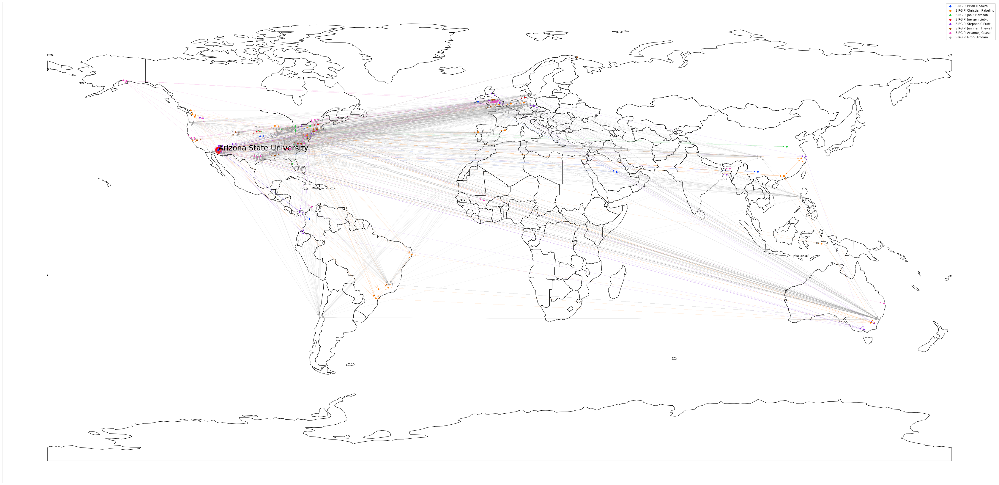

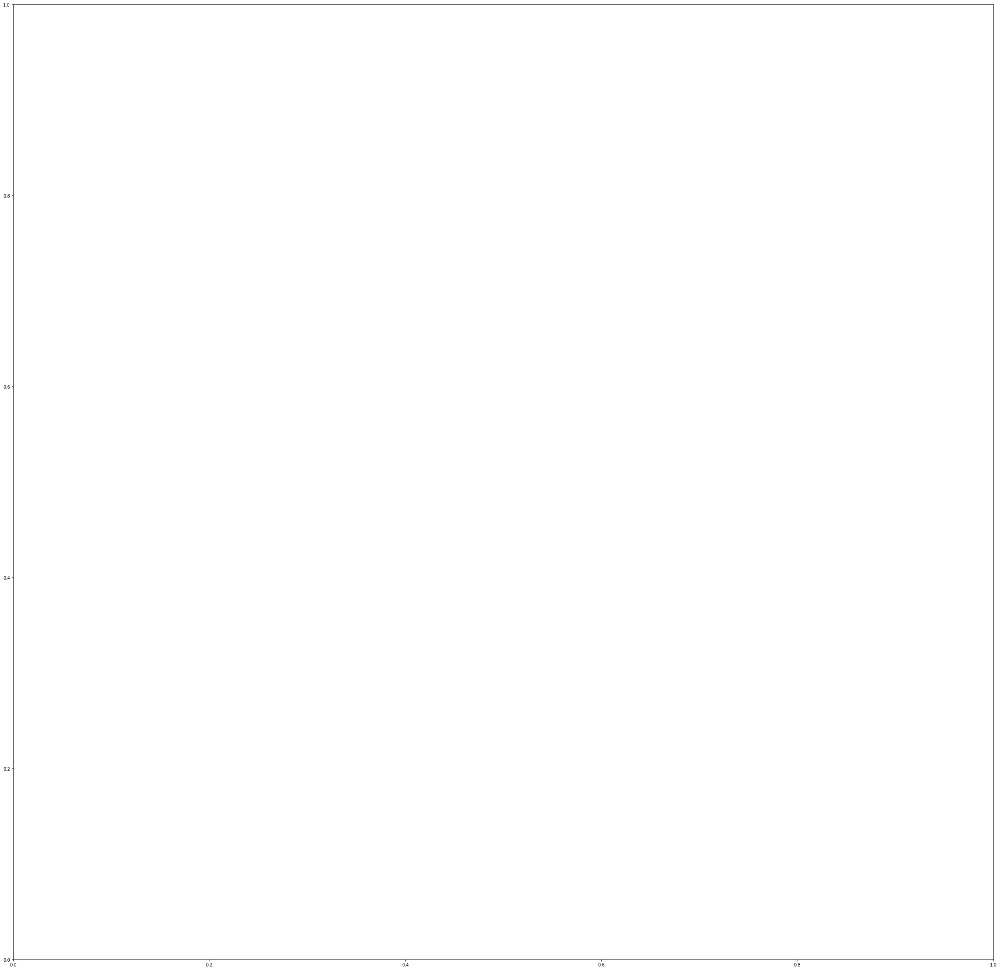

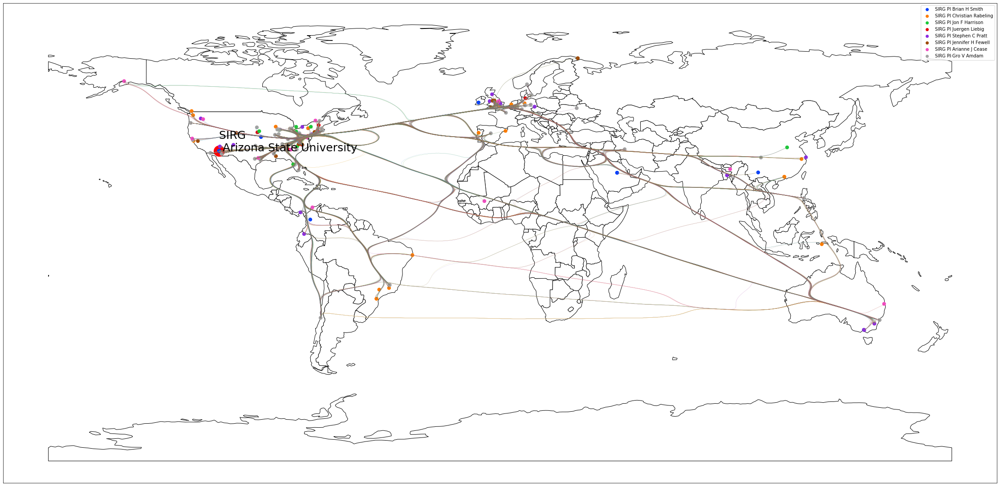

In [26]:

edge_colors = []
for edge in second.edges:
    edge_colors.append(tab10[sub_net_numb[edge[0]]])
df = pd.DataFrame({"Latitude": lat, "Longitude": long, "name": node_location_name})
gdf = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude)
)
world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))

graph_for_app(world,second,edge_colors,colors,sirg_author_list,tab10)

fig, ax3, plt_bundled, segments = edge_bundle(
    second, world, colors, sirg_author_list, tab10
)

#fig, ax3, plt_bundled, segments = edge_bundle(
#    second, world, colors, sirg_author_list, tab10
#)
assert segments is not None


#st.markdown(""" Computing an interactive version of this map now.""")
# In the meantime:
# A lot of potential coauthors were excluded
# see this list below:
# Note sometimes this includes core SIRG authors, where initials are written. For contrast..
# """
# )
missing_person_name = list(
    [k for k, v in both_sets_locations.items() if v[1] is None]
)
with open("missing_person_name.p", "rb") as f:
    missing_person_name = pickle.load(f)

missing_person_name = [
    name for name in missing_person_name if name not in str("Brian Smith")
]
ds_nodes = pd.DataFrame(missing_person_name, columns=["names"])
# st.dataframe(ds_nodes)
#st.markdown("""Okay now making an interactive version of this plot ...""")
#assert segments is not None
# graph_for_app(po



In [27]:
for name in sirg_author_list:
    if name in second.nodes:
        store_name = name    
for name in sirg_author_list:
    second.add_node(name, pos=(second.nodes[store_name]['pos'][0], second.nodes[store_name]['pos'][1]))


In [28]:
#second.nodes['Romain A. Dahan']

In [29]:
for name in sirg_author_list:
    if name in second.nodes:
        print(name)

Brian H Smith
Christian Rabeling
Jon F Harrison
Juergen Liebig
Stephen C Pratt
Jennifer H Fewell
Arianne J Cease
Gro V Amdam


In [30]:
for name in second.nodes:
    if name in sirg_author_list:
        print(name)

Christian Rabeling
Juergen Liebig
Brian H Smith
Jon F Harrison
Stephen C Pratt
Jennifer H Fewell
Arianne J Cease
Gro V Amdam


In [31]:
fig,colors = edge_bundle_plotly(
    second, world, colors, sirg_author_list, tab10, segments=segments,just_nodes= True
)

#fig["layout"]["width"] = 825
#fig["layout"]["height"] = 825


fig["layout"]["width"] = 825
fig["layout"]["height"] = 825


TypeError: tuple indices must be integers or slices, not str

In [33]:
#len(fig)

2

In [34]:
fig.show()


In [ ]:
fig,colors = edge_bundle_plotly(
    second, world, colors, sirg_author_list, tab10, segments=segments,just_nodes= False
)

In [35]:
for name in second.nodes:
    if name in sirg_author_list:
        print(name)

Christian Rabeling
Juergen Liebig
Brian H Smith
Jon F Harrison
Stephen C Pratt
Jennifer H Fewell
Arianne J Cease
Gro V Amdam


In [36]:
plt_unbundled, plt_bundled, ax3, fig = main_plot_routine(
    both_sets_locations, missing_person_name, node_location_name
)
fig.show()

KeyError: 'Brian H Smith'

In [38]:
figure_size = 100
hv.output(size=figure_size)
graph = hv.Graph.from_networkx(mg, networkx.layout.fruchterman_reingold_layout)
graph.opts(
    color_index="circle",
    width=450,
    height=450,
    show_frame=False,
    xaxis=None,
    yaxis=None,
    tools=["hover", "tap"],
    node_size=10,
    cmap=["blue", "orange"],
)


:Graph   [start,end]   (weight)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
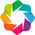

:Chord   [start,end]

In [39]:
hv.render(graph, backend="bokeh")

hv.extension('bokeh')
hv.output(size=200)
hv.Chord(mg)